<a href="https://colab.research.google.com/github/artms-18/ML-Projects/blob/main/Gun_Object_Detection_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gun Object Detection

In this project, I will be using an InceptionV3 Model to classify whether or not a Gun is present in an image, and where the Gun is, using bounding box prediction.

## My Steps

1. Import Object Detection Libraries
2. Visualize some images
3. Define the Category index dictionary
4. Download checkpoints
5. Locate and read from the configuration file
6. Modify the model configuration
7. Modify the model_config
8. Build the custom model
9. Define checkpoints for the box predictor
10. Define the temporary model checkpoints
11. Restore the checkpoint
12. Run a dumy image to generage model variables
13. Set training hyperparameters
14. Select prediction layer variables
15. Define the training step
16. Preprocess, predict and post process an image

# 1. Import Object Detection Libraries

In [ ]:
# using tensorflow object detection API
!git clone --depth 1 https://github.com/tensorflow/models/

Cloning into 'models'...
remote: Enumerating objects: 2687, done.
remote: Counting objects: 100% (2687/2687), done.
remote: Compressing objects: 100% (2235/2235), done.
remote: Total 2687 (delta 681), reused 1239 (delta 419), pack-reused 0
Receiving objects: 100% (2687/2687), 32.66 MiB | 23.74 MiB/s, done.
Resolving deltas: 100% (681/681), done.


In [ ]:
# install the Object detection API
!cd models/research/ && protoc object_detection/protos/*.proto --python_out=. && cp object_detection/packages/tf2/setup.py . && python -m pip install .

Processing /content/models/research
     |████████████████████████████████| 9.6MB 205kB/s 
     |████████████████████████████████| 358kB 38.1MB/s 
     |████████████████████████████████| 1.6MB 41.7MB/s 
     |████████████████████████████████| 153kB 41.6MB/s 
     |████████████████████████████████| 829kB 25.8MB/s 
     |████████████████████████████████| 2.3MB 35.0MB/s 
     |████████████████████████████████| 61kB 6.5MB/s 
     |████████████████████████████████| 51kB 5.7MB/s 
     |████████████████████████████████| 1.2MB 37.2MB/s 
     |████████████████████████████████| 686kB 18.0MB/s 
     |████████████████████████████████| 645kB 37.7MB/s 
     |████████████████████████████████| 174kB 43.3MB/s 
     |████████████████████████████████| 38.2MB 38.6MB/s 
     |████████████████████████████████| 61kB 7.2MB/s 
     |████████████████████████████████| 102kB 9.8MB/s 
  Created wheel for object-detection: filename=object_detection-0.1-cp37-none-any.whl size=1652954 sha256=0128245b81e785ffa96477b56

In [12]:
#importing packages

import matplotlib
import matplotlib.pyplot as plt

import os
import random
import zipfile
import io
import scipy.misc
import numpy as np

import glob
import imageio
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

#try:
  #%tensorflow_version 2.x
#except Exception:
  #pass

import tensorflow as tf
tf.get_logger().setLevel('ERROR')

In [ ]:
#import API packages

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils 
from object_detection.builders import model_builder
from object_detection.utils import colab_utils

In [15]:
# defining utility functions

def load_image_into_numpy_array(path):
  """
  Args:
    path: a file path
  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """

  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size

  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize = (12,16),
                    image_name = None):
  """
  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based, and match the keys in the label map.
    scores: a numpy array of shape [N] or None. If scores=None, then this function assumes that the boxes to be plotted
            are groundtruth boxesand plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding category index `id` and category name `name`)
                    keyed by category indices.
    figsize: size for the figure
    image_name: a name for the image file
  """
  image_np_with_annotations = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates = True,
      min_score_thresh = 0.8
  )

  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

In [ ]:
from google.colab import files

files.upload()

Saving archive (2).zip to archive (2).zip


{'archive (2).zip': b'PK\x03\x04-\x00\x00\x00\x08\x003KROO\xfa\x19\xca\xff\xff\xff\xff\xff\xff\xff\xff\r\x00\x14\x00Images/1.jpeg\x01\x00\x10\x00\xd2\x1a\x00\x00\x00\x00\x00\x00\xc2\x1a\x00\x00\x00\x00\x00\x00UvuT\xd4a\xd3\xf6\x0f\x96\x94\x8ee\xa5\xc3\xa5\x05\xe9\xee^\xba\x96F\xe9\xae\xa5\x95n\x10AX@Z\xba\x96\x10\x90N\tAB\x90\x94.e\ti\x04\xa5?\x9f\xe7\xfb\xce{\xbew\xe6\x9e9\xf7\xdc\xd79s\xcd=\xff\xcc<,<l\x00\xa4\xea*0\x15\x00\x03\x03\x000\xfe)\xf0\xb0\x0cD\x03\xf88\xb8\x14\x14\xe4`\n\n\n0\x18L\x05\x81<\x86P\x81!`\x08\xe4?F\x05\x01?\xfew\xe89\x98\x1e\xd3\xb0\xd2\x82\xc1\xcc\xfc\xcc\xac\x9c\xdc\xbc\xbc\xbc\x10FA1A\x1eQ\x0e\x1e^n\x8cG\x8f\x1e\x11\x13\x11\xd3\x90\x92Bx\xe8\xe9\xe9y\xb8yx\xfek\xff\x9f\xfb\x1f\xf9o$*\xfa\xdf\xfb\xff\xf5\xdc\xdc\xdc\x0f\x9f\x002< \x15\xc3\x1c\x84\xc1\x02`\x92a\x80\xc80\x1e\x06\x01\xda\x7f5b\xff\xa7\xd2\xff\x11l\x00\x13\x84\x85\x83\x81\xfb\x0fT \x050@\x98XX lll\\\x106\xf0\x9f\xff`\x92\x81\x98\xb1\xb0\xc9\xf9\xe5\xf5\xac\x11,\x11\xa98\x14\x02E\r\x94`\x85\xbe\x9

In [ ]:
local_zip = './archive (2).zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall("./archive")
zip_ref.close

<bound method ZipFile.close of <zipfile.ZipFile filename='./archive (2).zip' mode='r'>>

# 2. Visualize Some Images

In [18]:
%matplotlib inline

# assign the name (string of the directory containing the training images)
#base_dir = '/archive'
image_dir = 'archive/Images'

#declare list
images_np = []

for i in range(1,6):

  #define path to each image
  image_path = os.path.join(image_dir, str(i) + '.jpeg')
  print(image_path)

  #load images into an array and append to a list
  images_np.append(load_image_into_numpy_array(image_path))

archive/Images/1.jpeg
archive/Images/2.jpeg
archive/Images/3.jpeg
archive/Images/4.jpeg
archive/Images/5.jpeg


In [19]:
#configure plot settings via rcParams

plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [14,7]

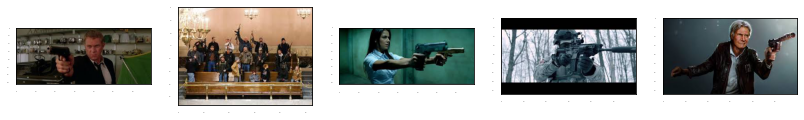

In [21]:
# plot images

for idx, image in enumerate(images_np):
  plt.subplot(1,5,idx+1)
  plt.imshow(image)

plt.show()

# Preparing data for training

In [22]:
# defining list for ground truth boxes

gt_boxes = []

In [32]:
print(len(os.listdir('archive/Images/')))

932


In [44]:

os.mkdir('archive/Images/training')
os.mkdir('archive/Images/testing')
#except OSError:
  #pass

FileExistsError: ignored

In [47]:
# splitting into training and testing
from shutil import copyfile

def split_data(SOURCE, TRAINING, TESTING, SPLIT_SIZE):
  files = []
  for filename in os.listdir(SOURCE):
    file = SOURCE + filename
    if os.path.getsize(file) > 0:
      files.append(filename)
    else:
      print(filename + " is zero length, so ignoring...")

    training_length = int(len(files)*SPLIT_SIZE)
    testing_length = int(len(files)-training_length)
    #shuffled_set = random.sample(files, len(files))
    training_set = files[0:training_length]
    testing_set = files[-testing_length:]

    for filename in training_set:
      this_file = SOURCE + filename
      destination = TRAINING + filename
      copyfile(this_file, destination)

    for filename in testing_set:
      this_file = SOURCE + filename
      destination = TESTING + filename
      copyfile(this_file, destination)


SOURCE = "archive/Images/"
TRAINING_IMAGES_DIR = "archive/Images/training/"
TESTING_IMAGES_DIR = "archive/Images/testing/"

In [48]:
SPLIT_SIZE = 0.8

split_data(SOURCE, TRAINING_IMAGES_DIR, TESTING_IMAGES_DIR, SPLIT_SIZE)

IsADirectoryError: ignored